# Determine multi-agent plan conflict

In [14]:
import sys
sys.path.append('../')

sys.path.append('../../')


from panav.env import NavigationEnv, Box2DRegion, PolygonRegion, box_2d_center, line_seg_to_obstacle
from panav.viz import draw_env
from panav.SAMP import Tube_Planning
from panav.util import interpolate_positions,unique_tx
from panav.PBS.PBS import PBS
from panav.PBS.conflict import MA_plan_conflict


from panav.viz import animation
from IPython.display import HTML, display

import shapely
import numpy as np
from matplotlib import pyplot as plt

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# The environment

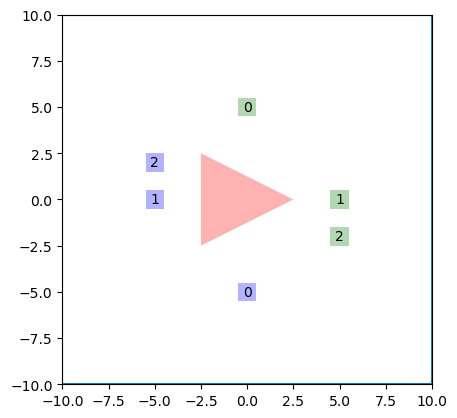

In [2]:

start_locs = np.array([[0,-5],[-5,0],[-5,2]])*1.0
goal_locs = np.array([[0,5],[5,0],[5,-2]])*1.0


start_box_side = np.array([1,1])
goal_box_side = np.array([1,1])

starts = [box_2d_center(s,start_box_side) for s in start_locs]

goals = [box_2d_center(g,goal_box_side) for g in goal_locs]

limits = [(-10.0,10.0),(-10.0,10.0)]

O1 = PolygonRegion([(-2.5,2.5),(-2.5,-2.5),(2.5,0)])

env = NavigationEnv(limits,[O1],starts,goals)

draw_env(env)


# Planning with fixed-priority conflict resolution

In [15]:
bloating_r = 0.5
d = 2
K = 5
t0 = 0
vmax = 1.0

In [16]:
agents = set(np.arange(len(env.starts)))
plan = []
for agent in agents:
    start = env.starts[agent]
    goal = env.goals[agent]

    t, xs = Tube_Planning(env,start,goal,vmax,bloating_r,\
                                 plan,\
                                d,K,t0)
    t,xs = unique_tx(t,xs)
    plan.append((t,xs))

In [17]:
print('flowtime:', np.sum([t[-1] for t,xs in plan]))

flowtime: 44.326951417661355


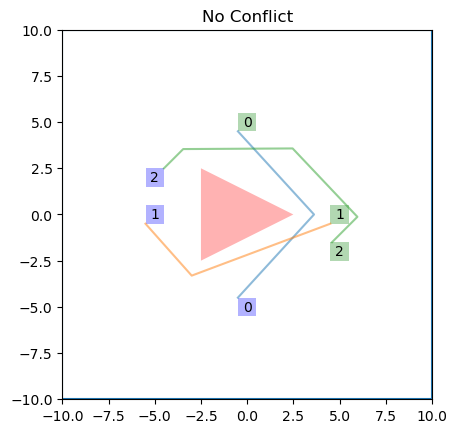

In [18]:
draw_env(env,[x for t,x in plan])

plt.title('Conflict' if MA_plan_conflict(plan,bloating_r)
 else 'No Conflict')


plt.show()

In [26]:
interp_dt = 0.1
pos = []

for t,x in plan:
    t,x = interpolate_positions(t,x,interp_dt)
    pos.append(x)

anim = animation(env, pos, bloating_r, dt = interp_dt / 4)
display(HTML(anim.to_jshtml()))
plt.close()   # Avoid plotting an extra figure.

# Planning with PBS

In [5]:
metric = 'flowtime'
search_type = 'depth_first'

max_iter = 20

solution,cost = PBS(env,vmax,bloating_r,d,K,t0,\
                    max_iter,metric,search_type)

In [6]:
print('flowtime:', np.sum([t[-1] for t,x in solution]))

flowtime: 40.909027802014954


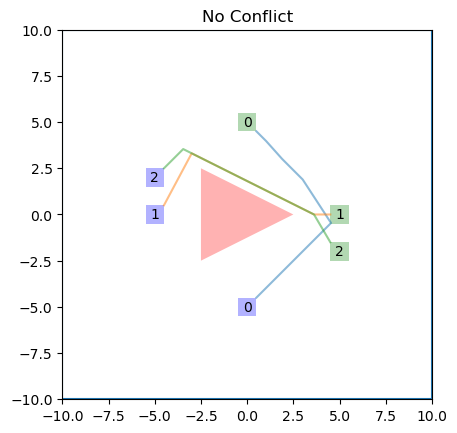

In [13]:

draw_env(env,[x for t,x in solution])

plt.title('Conflict' if MA_plan_conflict(solution,bloating_r)
 else 'No Conflict')

plt.show()

In [10]:
interp_dt = 0.1
pos = []

for t,x in solution:
    t,x = interpolate_positions(t,x,interp_dt)
    pos.append(x)

anim = animation(env, pos, bloating_r, dt = interp_dt / 4)
display(HTML(anim.to_jshtml()))
plt.close()   # Avoid plotting an extra figure.

## Note that the flowtime of PBS is indeed lower than fixed-priority planning.